In [ ]:
# To check if your dataset is in the FileStore
dbutils.fs.ls("dbfs:/FileStore/tables/FaultDataset.csv")


Out[1]: [FileInfo(path='dbfs:/FileStore/tables/FaultDataset.csv', name='FaultDataset.csv', size=1703184, modificationTime=1678404061000)]

In [ ]:
# import mlflow and autolog machine learning runs

import mlflow

mlflow.pyspark.ml.autolog()

In [ ]:
#header equals true indicates we use first row as header
#inferSchema indicates import the data types as it is on the originals csv file

FaultDataset = spark.read.csv("/FileStore/tables/FaultDataset.csv",
                             header = "true",
                            inferSchema ="true")

In [ ]:
# this code helps get the structure of the dataset and we can also view schema by clicking on the output in command 2

FaultDataset.printSchema()

root
 |-- 1: double (nullable = true)
 |-- 2: double (nullable = true)
 |-- 3: double (nullable = true)
 |-- 4: double (nullable = true)
 |-- 5: double (nullable = true)
 |-- 6: double (nullable = true)
 |-- 7: double (nullable = true)
 |-- 8: double (nullable = true)
 |-- 9: double (nullable = true)
 |-- 10: double (nullable = true)
 |-- 11: double (nullable = true)
 |-- 12: double (nullable = true)
 |-- 13: double (nullable = true)
 |-- 14: double (nullable = true)
 |-- 15: double (nullable = true)
 |-- 16: double (nullable = true)
 |-- 17: double (nullable = true)
 |-- 18: double (nullable = true)
 |-- 19: double (nullable = true)
 |-- 20: double (nullable = true)
 |-- fault_detected: integer (nullable = true)



try visualizing histogram

In [ ]:
# using display to view the fault dataset

FaultDataset.display()

1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,fault_detected
0.3503125,0.3496875,0.35,0.3459375,0.3475,0.3459375,0.341875,0.3434375,0.355,0.3553125,0.3459375,0.3525,0.3575,0.3590625,0.35875,0.3484375,0.3590625,0.35,0.3559375,0.3490625,0
0.5090625,0.484375,0.046875,0.071875,0.06,0.0634375,0.0575,0.0546875,0.0559375,0.058125,0.0628125,0.065625,0.0640625,0.0634375,0.0534375,0.084375,0.0615625,0.05375,0.076875,0.056875,0
0.0928125,0.0975,0.1096875,0.1025,0.09625,0.1053125,0.09875,0.098125,0.091875,0.0909375,0.09875,0.103125,0.1,0.1034375,0.1015625,0.0978125,0.0990625,0.10375,0.098125,0.1040625,0
0.09375,0.089375,0.091875,0.0996875,0.0909375,0.096875,0.0940625,0.096875,0.096875,0.099375,0.099375,0.0959375,0.0959375,0.0940625,0.09125,0.0996875,0.09375,0.0934375,0.0971875,0.094375,0
0.036875,0.0440625,0.038125,0.0428125,0.0353125,0.0340625,0.033125,0.0403125,0.0346875,0.036875,0.035625,0.03625,0.0409375,0.039375,0.035,0.040625,0.0384375,0.036875,0.04,0.0371875,0
0.135625,0.3034375,0.13875,0.140625,0.126875,0.130625,0.139375,0.143125,0.1290625,0.140625,0.1340625,0.1396875,0.1384375,0.1453125,0.1453125,0.1496875,0.1440625,0.1359375,0.1453125,0.14625,0
0.3446875,0.35125,0.3353125,0.3471875,0.34625,0.348125,0.3478125,0.3521875,0.3525,0.35125,0.3571875,0.360625,0.3640625,0.36625,0.3640625,0.3634375,0.3475,0.35375,0.1575,0.351875,0
0.036875,0.035625,0.03125,0.0375,0.0390625,0.034375,0.0315625,0.031875,0.0378125,0.0321875,0.0371875,0.038125,0.035,0.0353125,0.0325,0.03,0.0325,0.0321875,0.0321875,0.03125,0
0.0371875,0.039375,0.033125,0.04,0.04125,0.03875,0.035625,0.0384375,0.0378125,0.0365625,0.033125,0.0365625,0.03375,0.034375,0.0346875,0.04125,0.0365625,0.035,0.034375,0.0396875,0
0.3590625,0.3609375,0.360625,0.3590625,0.355,0.365,0.355625,0.358125,0.3575,0.3578125,0.355625,0.3584375,0.3521875,0.3459375,0.3521875,0.3509375,0.3525,0.35625,0.353125,0.3540625,0


In [ ]:
#This checks the number of rows and columns in the Fault dataset

rows_num = FaultDataset.count()

# Get the number of columns
cols_num = len(FaultDataset.columns)

# Print the dimensions of the DataFrame
print("Number of rows: ", rows_num)
print("Number of columns: ", cols_num)


Number of rows:  9292
Number of columns:  21


In [ ]:
# Grouping the Dataset by the target column(fault detected) and count the number of occurrences of each value
target_column = FaultDataset.groupBy("fault_detected").count()

# Show the distribution of the target column
target_column.show()


+--------------+-----+
|fault_detected|count|
+--------------+-----+
|             1| 4646|
|             0| 4646|
+--------------+-----+



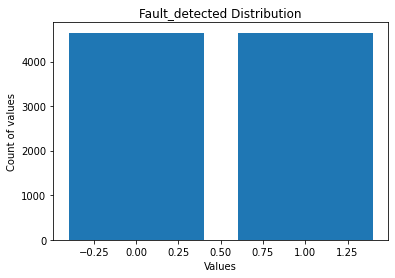

In [ ]:
# Using matplotlib we visualize the distribution of the Target column. this is to check for imbalance  and ensure other variables are not in the dataset.

import matplotlib.pyplot as plt


# Group the DataFrame by the target column and count the number of occurrences of each value
target_col = FaultDataset.groupBy("fault_detected").count().orderBy("fault_detected")

# Extract the values of the target column and the count column as lists
targets = target_col.select("fault_detected").rdd.flatMap(lambda x: x).collect()
counts = target_col.select("count").rdd.flatMap(lambda x: x).collect()

# Plot the bar chart
plt.bar(targets, counts)
plt.title("Fault_detected Distribution")
plt.xlabel("Values")
plt.ylabel("Count of values")
plt.show()


In [ ]:
# checking for the mean for each column in the dataset

from pyspark.sql.functions import mean

means = FaultDataset.agg(*(mean(c).alias(c) for c in FaultDataset.columns))

print("Mean values of each column:")
means.display()



Mean values of each column:


1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,fault_detected
0.34162330499354226,0.34263116121394677,0.3421213812957383,0.34213907124407966,0.3428434405940584,0.3428279366659492,0.3427147008179088,0.34306577566724017,0.34317299155187225,0.3439251842983209,0.3441075320167876,0.34398424047567727,0.3441183275936292,0.3448787599547991,0.34489994753551373,0.3458342525828662,0.34563488753766686,0.3457525290572536,0.3465221427034015,0.346670724817048,0.5


In [ ]:
from pyspark.sql.functions import isnan, when, count, col


# Count the number of missing values in the DataFrame
missingNumber = FaultDataset.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in FaultDataset.columns]).toPandas()

# Display the missing value counts
display(missingNumber)


1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,fault_detected
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12,9))
sns.pairplot(features)
plt.title('Feature Pairplot', size=15)
plt.savefig('Feature Pairplot', dpi=2500, bbox_inches='tight')
plt.show()

<h5> DATA PREPROCESSING <h5/>

In [ ]:
# preprocess data into the correct format

from pyspark.ml.feature import RFormula

FaultDataset = FaultDataset.drop("features") # line 5 Drops the output column if already exist

preprocess = RFormula(formula = "fault_detected ~ .") # the full stop indicates the use of all other columns 

FaultDataset = preprocess.fit(FaultDataset).transform(FaultDataset) # fits and transform  the fault dataset

FaultDataset.show(5)

2023/04/28 12:17:10 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '4a13999ae04046e695ba69a56474c178', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+--------------+--------------------+-----+
|        1|        2|        3|        4|        5|        6|        7|        8|        9|       10|       11|       12|       13|       14|       15|       16|       17|       18|       19|       20|fault_detected|            features|label|
+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+--------------+--------------------+-----+
|0.3

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(14,11))
sns.pairplot(features)
plt.title('Feature Pairplot', size=20)
plt.savefig('Feature Pairplot', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# splitting data into training and test datasets

(trainingDF,testDF) = FaultDataset.randomSplit([0.7, 0.3], seed = 100)

using the decision tree classifier estimator

In [ ]:
# using decision tree classifier estimator

from pyspark.ml.classification import DecisionTreeClassifier

dt = DecisionTreeClassifier(labelCol = "label",featuresCol="features")

# train the model

model = dt.fit(trainingDF)

2023/04/28 12:17:14 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '2dfd94b026fe47358e6f7d3ceb8ce6a6', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/04/28 12:17:23 WARNING mlflow.pyspark.ml: Model inputs contain unsupported Spark data types: [StructField('features', VectorUDT(), True)]. Model signature is not logged.
2023/04/28 12:17:32 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2023/04/28 12:18:29 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/databricks/python/lib/python3.9/site-packages/_distutils_hack/__init__.py:30: UserWarning: Setuptools is replacing distutils."


Evaluating the model, to evaluate the model we need to use our trained model to make predictions on the data which we did not use for training. we do this using the transform() method

In [ ]:
# Make predictions on the test dataset

predictions = model.transform(testDF)

predictions.display()

1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,fault_detected,features,label,rawPrediction,probability,prediction
0.0253125,0.039375,0.0528125,0.056875,0.0725,0.041875,0.5109375,0.5628125,0.605,0.6025,0.6259375,0.6,0.6090625,0.6034375,0.594375,0.6021875,0.580625,0.5703125,0.0503125,0.069375,1,"Map(vectorType -> dense, length -> 20, values -> List(0.0253125, 0.039375, 0.0528125, 0.056875, 0.0725, 0.041875, 0.5109375, 0.5628125, 0.605, 0.6025, 0.6259375, 0.6, 0.6090625, 0.6034375, 0.594375, 0.6021875, 0.580625, 0.5703125, 0.0503125, 0.069375))",1.0,"Map(vectorType -> dense, length -> 2, values -> List(12.0, 139.0))","Map(vectorType -> dense, length -> 2, values -> List(0.07947019867549669, 0.9205298013245033))",1.0
0.02625,0.0325,0.0296875,0.0353125,0.0328125,0.0265625,0.03125,0.0328125,0.029375,0.0284375,0.0334375,0.0321875,0.0296875,0.0325,0.0284375,0.0259375,0.03125,0.02875,0.0328125,0.0334375,1,"Map(vectorType -> dense, length -> 20, values -> List(0.02625, 0.0325, 0.0296875, 0.0353125, 0.0328125, 0.0265625, 0.03125, 0.0328125, 0.029375, 0.0284375, 0.0334375, 0.0321875, 0.0296875, 0.0325, 0.0284375, 0.0259375, 0.03125, 0.02875, 0.0328125, 0.0334375))",1.0,"Map(vectorType -> dense, length -> 2, values -> List(3155.0, 142.0))","Map(vectorType -> dense, length -> 2, values -> List(0.9569305429178041, 0.043069457082195936))",0.0
0.02625,0.0334375,0.0271875,0.0275,0.02625,0.034375,0.0321875,0.031875,0.031875,0.0346875,0.0340625,0.0303125,0.03375,0.03125,0.0290625,0.0325,0.0328125,0.029375,0.0253125,0.039375,1,"Map(vectorType -> dense, length -> 20, values -> List(0.02625, 0.0334375, 0.0271875, 0.0275, 0.02625, 0.034375, 0.0321875, 0.031875, 0.031875, 0.0346875, 0.0340625, 0.0303125, 0.03375, 0.03125, 0.0290625, 0.0325, 0.0328125, 0.029375, 0.0253125, 0.039375))",1.0,"Map(vectorType -> dense, length -> 2, values -> List(3155.0, 142.0))","Map(vectorType -> dense, length -> 2, values -> List(0.9569305429178041, 0.043069457082195936))",0.0
0.0265625,0.0284375,0.02625,0.0325,0.0296875,0.0353125,0.0328125,0.0265625,0.03125,0.0328125,0.029375,0.0284375,0.0334375,0.0321875,0.0296875,0.0325,0.0284375,0.0259375,0.03125,0.02875,1,"Map(vectorType -> dense, length -> 20, values -> List(0.0265625, 0.0284375, 0.02625, 0.0325, 0.0296875, 0.0353125, 0.0328125, 0.0265625, 0.03125, 0.0328125, 0.029375, 0.0284375, 0.0334375, 0.0321875, 0.0296875, 0.0325, 0.0284375, 0.0259375, 0.03125, 0.02875))",1.0,"Map(vectorType -> dense, length -> 2, values -> List(3155.0, 142.0))","Map(vectorType -> dense, length -> 2, values -> List(0.9569305429178041, 0.043069457082195936))",0.0
0.0265625,0.02875,0.0321875,0.0290625,0.0271875,0.0265625,0.0296875,0.0278125,0.0284375,0.0271875,0.0284375,0.0309375,0.0309375,0.02875,0.0340625,0.0296875,0.03125,0.0359375,0.671875,0.0640625,1,"Map(vectorType -> dense, length -> 20, values -> List(0.0265625, 0.02875, 0.0321875, 0.0290625, 0.0271875, 0.0265625, 0.0296875, 0.0278125, 0.0284375, 0.0271875, 0.0284375, 0.0309375, 0.0309375, 0.02875, 0.0340625, 0.0296875, 0.03125, 0.0359375, 0.671875, 0.0640625))",1.0,"Map(vectorType -> dense, length -> 2, values -> List(0.0, 104.0))","Map(vectorType -> dense, length -> 2, values -> List(0.0, 1.0))",1.0
0.0265625,0.0315625,0.0296875,0.0321875,0.0275,0.0315625,0.03625,0.03375,0.03375,0.0271875,0.030625,0.0334375,0.029375,0.02625,0.0353125,0.0346875,0.036875,0.0365625,0.03,0.0309375,1,"Map(vectorType -> dense, length -> 20, values -> List(0.0265625, 0.0315625, 0.0296875, 0.0321875, 0.0275, 0.0315625, 0.03625, 0.03375, 0.03375, 0.0271875, 0.030625, 0.0334375, 0.029375, 0.02625, 0.0353125, 0.0346875, 0.036875, 0.0365625, 0.03, 0.0309375))",1.0,"Map(vectorType -> dense, length -> 2, values -> List(3155.0, 142.0))","Map(vectorType -> dense, length -> 2, values -> List(0.9569305429178041, 0.043069457082195936))",0.0
0.026875,0.024375,0.03,0.03375,0.02625,0.0334375,0.0271875,0.0275,0.02625,0.034375,0.0321875,0.031875,0.031875,0.0346875,0.0340625,0.0303125,0.03375,0.03125,0.0290625,0.0325,1,"M

the output from command 17 included the original columns from the dataset with 3 new columns which are rawprediction probability and prediction

In [ ]:
# Use evaluator to measure accuracy of predictions on test data

from pyspark.ml.evaluation import MulticlassClassificationEvaluator

evaluator =MulticlassClassificationEvaluator(labelCol ="label", predictionCol = "prediction", metricName="accuracy")

accuracy = evaluator.evaluate(predictions)

print("Accuracy = %g " % (accuracy))



Accuracy = 0.952432 


In [ ]:
from pyspark.mllib.evaluation import MulticlassMetrics

# make predictions
predictions2 = model.transform(testDF)

# create an RDD of (prediction, label) pairs
predictionAndLabels = predictions2.select("prediction", "label").rdd

# create a MulticlassMetrics object
metrics = MulticlassMetrics(predictionAndLabels)

# compute the confusion matrix
confusion_matrix = metrics.confusionMatrix().toArray()

print("Confusion matrix:\n", confusion_matrix)


/databricks/spark/python/pyspark/sql/context.py:165: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(
Confusion matrix:
 [[1347.   27.]
 [ 105. 1296.]]


In [ ]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# make predictions on test data using trained model
predictions = model.transform(testDF)

# evaluate the model using MulticlassClassificationEvaluator
evaluator = MulticlassClassificationEvaluator(predictionCol="prediction", labelCol="label", metricName="accuracy")
accuracy = evaluator.evaluate(predictions)
print("Accuracy: ", accuracy)

# compute confusion matrix
conf_matrix = predictions.groupBy("label", "prediction").count().orderBy("label")
conf_matrix.show()


Accuracy:  0.9524324324324325
+-----+----------+-----+
|label|prediction|count|
+-----+----------+-----+
|  0.0|       1.0|   27|
|  0.0|       0.0| 1347|
|  1.0|       1.0| 1296|
|  1.0|       0.0|  105|
+-----+----------+-----+



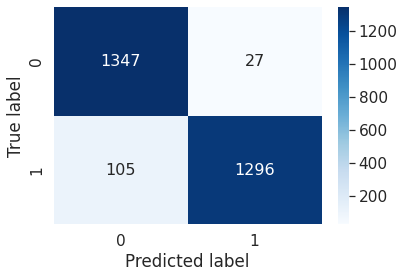

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Convert the predicted labels and actual labels to numpy arrays
y_pred = predictions.select('prediction').rdd.map(lambda x: x[0]).collect()
y_true = predictions.select('label').rdd.map(lambda x: x[0]).collect()

# Create the confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
sns.set(font_scale=1.4)
sns.heatmap(cm, annot=True, annot_kws={"size": 16}, cmap='Blues', fmt='g')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()


In [ ]:
#using ML Flow and viewing run details

In [ ]:
from pyspark.ml.tuning import ParamGridBuilder

# create a parameter grid

Parameters = ParamGridBuilder()\
.addGrid(dt.impurity,["gini","entropy"])\
.addGrid(dt.maxDepth, [3, 5, 7])\
.addGrid(dt.maxBins, [16, 32,64])\
.build()

In [ ]:
from pyspark.ml.tuning import TrainValidationSplit

#Defining TrainValidationSplit

tvs = TrainValidationSplit()\
.setSeed(100)\
.setTrainRatio(0.75)\
.setEstimatorParamMaps(Parameters)\
.setEstimator(dt)\
.setEvaluator(evaluator)

# train model using grid search
gridsearchModel = tvs.fit(trainingDF)

2023/04/28 12:18:48 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '6b64a0b1ea1d432887f1fd0cd499673f', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/04/28 12:19:56 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2023/04/28 12:20:59 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


In [ ]:
#selecting the best model and identify the parameters

bestModel = gridsearchModel.bestModel

print("Parameters for the Best Model:")
print("MaxDepth Parameter: %g" %bestModel.getMaxDepth())
print("Impurity Parameter: %s" %bestModel.getImpurity())
print("MaxBins Parameter: %g" %bestModel.getMaxBins())

Parameters for the Best Model:
MaxDepth Parameter: 7
Impurity Parameter: entropy
MaxBins Parameter: 64


In [ ]:
#use the best model to make predictions on the holdout test set
 
evaluator.evaluate(bestModel.transform(testDF))

Out[23]: 0.961081081081081

spliting the training and test data to a ration of 80 percent to 20 percent

In [ ]:
from pyspark.ml.tuning import TrainValidationSplit

#Defining TrainValidationSplit, spliting the data with 80 percent
tvs2 = TrainValidationSplit()\
.setSeed(100)\
.setTrainRatio(0.80)\
.setEstimatorParamMaps(Parameters)\
.setEstimator(dt)\
.setEvaluator(evaluator)

In [ ]:
# train model using grid search
gridsearchModel2 = tvs2.fit(trainingDF)

2023/04/28 12:21:56 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'dff70d678faa49a4b9a8659f94fbf37c', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/04/28 12:22:54 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2023/04/28 12:23:58 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


In [ ]:
bestModel2 = gridsearchModel2.bestModel

print("Parameters for the Best Model:")
print("MaxDepth Parameter: %g" %bestModel.getMaxDepth())
print("Impurity Parameter: %s" %bestModel.getImpurity())
print("MaxBins Parameter: %g" %bestModel.getMaxBins())

Parameters for the Best Model:
MaxDepth Parameter: 7
Impurity Parameter: entropy
MaxBins Parameter: 64


In [ ]:
evaluator.evaluate(bestModel2.transform(testDF))

Out[27]: 0.9618018018018017

using rato 0.85 as training set

In [ ]:
from pyspark.ml.tuning import TrainValidationSplit

#Defining TrainValidationSplit, spliting the data with 80 percent
tvs3 = TrainValidationSplit()\
.setSeed(100)\
.setTrainRatio(0.85)\
.setEstimatorParamMaps(Parameters)\
.setEstimator(dt)\
.setEvaluator(evaluator)

In [ ]:
# train model using grid search
gridsearchModel3 = tvs3.fit(trainingDF)

2023/04/28 12:24:55 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'b925fa21c1a04411b9995a3c985e97d3', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/04/28 12:25:50 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2023/04/28 12:26:56 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


In [ ]:
bestModel3 = gridsearchModel3.bestModel

print("Parameters for the Best Model:")
print("MaxDepth Parameter: %g" %bestModel3.getMaxDepth())
print("Impurity Parameter: %s" %bestModel3.getImpurity())
print("MaxBins Parameter: %g" %bestModel3.getMaxBins())

Parameters for the Best Model:
MaxDepth Parameter: 7
Impurity Parameter: entropy
MaxBins Parameter: 64


In [ ]:
evaluator.evaluate(bestModel2.transform(testDF))

Out[31]: 0.9618018018018017

<h5> USING DIFFERENT CLASSIFICATION MODELS 
  Using Logistic Regrssion <h5/>

In [ ]:
# logistic regression classifier 

from pyspark.ml.classification import LogisticRegression

lr = LogisticRegression(labelCol="label", featuresCol="features")

# train the model
model2 = lr.fit(trainingDF)


2023/04/28 12:27:55 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'f6e64d9aa52e44d49c8003f26bed2625', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/04/28 12:28:04 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


In [ ]:
# make predictions

predictions2 = model2.transform(testDF)

predictions2.show()

+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+--------------+--------------------+-----+--------------------+--------------------+----------+
|        1|        2|        3|        4|        5|        6|        7|        8|        9|       10|       11|       12|       13|       14|       15|       16|       17|       18|       19|       20|fault_detected|            features|label|       rawPrediction|         probability|prediction|
+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+--------------+--------------------+-----+--------------------+--------------------+----------+
|0.0253125| 0.039375|0.0528125| 0.056875|   0.0725| 0.041875|0.5109375|0.5628125|    0.605|   0.6025|0.625937

In [ ]:

from pyspark.ml.evaluation import MulticlassClassificationEvaluator

evaluator =MulticlassClassificationEvaluator(labelCol ="label", predictionCol = "prediction", metricName="accuracy")

accuracy = evaluator.evaluate(predictions2)

print("Accuracy = %g " % (accuracy))


Accuracy = 0.808649 


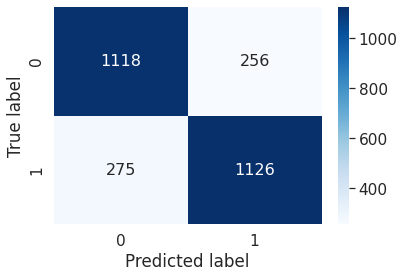

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Convert the predicted labels and actual labels to numpy arrays
y_pred = predictions2.select('prediction').rdd.map(lambda x: x[0]).collect()
y_true = predictions2.select('label').rdd.map(lambda x: x[0]).collect()

# Create the confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
sns.set(font_scale=1.4)
sns.heatmap(cm, annot=True, annot_kws={"size": 16}, cmap='Blues', fmt='g')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()


In [ ]:
#using ML Flow for logistic regression/Hyper parameter checking

In [ ]:
paramGrid = ParamGridBuilder() \
            .addGrid(lr.regParam, [0.1, 0.01]) \
            .addGrid(lr.fitIntercept, [False, True]) \
            .addGrid(lr.elasticNetParam, [0.0, 0.5, 1.0]) \
            .build()


In [ ]:
from pyspark.ml.tuning import TrainValidationSplit

#Defining TrainValidationSplit

tvs_lr = TrainValidationSplit()\
.setSeed(100)\
.setTrainRatio(0.75)\
.setEstimatorParamMaps(paramGrid)\
.setEstimator(lr)\
.setEvaluator(evaluator)

# train model using grid search
gridsearchModel23 = tvs_lr.fit(trainingDF)

2023/04/28 12:29:04 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'b5a5977ad07a4898a16b7e3c95a4a127', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/04/28 12:30:52 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2023/04/28 12:32:00 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


In [ ]:
bestModel_lr = gridsearchModel23.bestModel

print("Parameters for the Best Model:")
print("regParam Parameter: %g" % bestModel_lr.getOrDefault('regParam'))
print("fitIntercept Parameter: %s" % bestModel_lr.getOrDefault('fitIntercept'))
print("elasticNetParam Parameter: %g" % bestModel_lr.getOrDefault('elasticNetParam'))


Parameters for the Best Model:
regParam Parameter: 0.01
fitIntercept Parameter: True
elasticNetParam Parameter: 0


In [ ]:
print("Parameters for the Best Model:")
print("regParam Parameter: %g" %bestModel_lr.getRegParam())
print("fitIntercept Parameter: %s" %bestModel_lr.getFitIntercept())
print("elasticNetParam Parameter: %g" %bestModel_lr.getElasticNetParam())


Parameters for the Best Model:
regParam Parameter: 0.01
fitIntercept Parameter: True
elasticNetParam Parameter: 0


In [ ]:
#use the best model to make predictions on the holdout test set
 
evaluator.evaluate(bestModel_lr.transform(testDF))

Out[41]: 0.8064864864864865

<h5> Using Random Forest <h5/>

In [ ]:
# using randon forest
from pyspark.ml.classification import RandomForestClassifier

rf = RandomForestClassifier(labelCol="label", featuresCol="features", numTrees=10)

# train the model
model3 = rf.fit(trainingDF)



2023/04/28 12:32:59 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '9a42eb4b13d94f5da14407f4b4899371', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/04/28 12:33:10 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


In [ ]:
predictions3 = model3.transform(testDF)

predictions3.show()

+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+--------------+--------------------+-----+--------------------+--------------------+----------+
|        1|        2|        3|        4|        5|        6|        7|        8|        9|       10|       11|       12|       13|       14|       15|       16|       17|       18|       19|       20|fault_detected|            features|label|       rawPrediction|         probability|prediction|
+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+--------------+--------------------+-----+--------------------+--------------------+----------+
|0.0253125| 0.039375|0.0528125| 0.056875|   0.0725| 0.041875|0.5109375|0.5628125|    0.605|   0.6025|0.625937

In [ ]:

from pyspark.ml.evaluation import MulticlassClassificationEvaluator

evaluator =MulticlassClassificationEvaluator(labelCol ="label", predictionCol = "prediction", metricName="accuracy")

accuracy = evaluator.evaluate(predictions3)

print("Accuracy = %g " % (accuracy))

Accuracy = 0.965045 


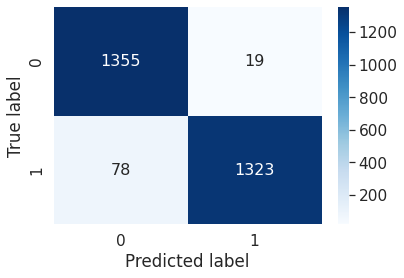

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Convert the predicted labels and actual labels to numpy arrays
y_pred = predictions3.select('prediction').rdd.map(lambda x: x[0]).collect()
y_true = predictions3.select('label').rdd.map(lambda x: x[0]).collect()

# Create the confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
sns.set(font_scale=1.4)
sns.heatmap(cm, annot=True, annot_kws={"size": 16}, cmap='Blues', fmt='g')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()


In [ ]:
paramGrid = ParamGridBuilder().addGrid(rf.numTrees, [10, 20, 30]).addGrid(rf.maxDepth, [3, 5, 7]).addGrid(rf.impurity, ['gini', 'entropy']).build()

In [ ]:
from pyspark.ml.tuning import TrainValidationSplit

#Defining TrainValidationSplit

tvs_rf = TrainValidationSplit()\
.setSeed(100)\
.setTrainRatio(0.75)\
.setEstimatorParamMaps(paramGrid)\
.setEstimator(rf)\
.setEvaluator(evaluator)

# train model using grid search
gridsearchModel25 = tvs_rf.fit(trainingDF)

2023/04/28 12:34:14 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '3cdda176f13047fabb995744e6f52123', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/04/28 12:35:23 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2023/04/28 12:36:34 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


In [ ]:
bestModel_rf = gridsearchModel25.bestModel

print("Parameters for the Best Model:")
print("MaxDepth Parameter: %g" % bestModel_rf.getOrDefault('maxDepth'))
print("Impurity Parameter: %s" % bestModel_rf.getOrDefault('impurity'))
print("numTrees Parameter: %g" % bestModel_rf.getOrDefault('numTrees'))


Parameters for the Best Model:
MaxDepth Parameter: 7
Impurity Parameter: gini
numTrees Parameter: 10


In [ ]:
evaluator.evaluate(bestModel_rf.transform(testDF))

Out[49]: 0.9657657657657658

<h5> Support Vector Machine <5/>

In [ ]:
# for support vector Machines
from pyspark.ml.classification import LinearSVC

svm = LinearSVC(labelCol="label", featuresCol="features")

# train the model
model4 = svm.fit(trainingDF)


2023/04/28 12:37:36 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'a05c204e7986496d826edcb85f108c3e', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/04/28 12:38:00 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


In [ ]:
predictions4 = model4.transform(testDF)

predictions4.show()

+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+--------------+--------------------+-----+--------------------+----------+
|        1|        2|        3|        4|        5|        6|        7|        8|        9|       10|       11|       12|       13|       14|       15|       16|       17|       18|       19|       20|fault_detected|            features|label|       rawPrediction|prediction|
+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+--------------+--------------------+-----+--------------------+----------+
|0.0253125| 0.039375|0.0528125| 0.056875|   0.0725| 0.041875|0.5109375|0.5628125|    0.605|   0.6025|0.6259375|      0.6|0.6090625|0.6034375| 0.594375|0.6021875| 0.580625|0

In [ ]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

evaluator =MulticlassClassificationEvaluator(labelCol ="label", predictionCol = "prediction", metricName="accuracy")

accuracy = evaluator.evaluate(predictions4)

print("Accuracy = %g " % (accuracy))

Accuracy = 0.805766 


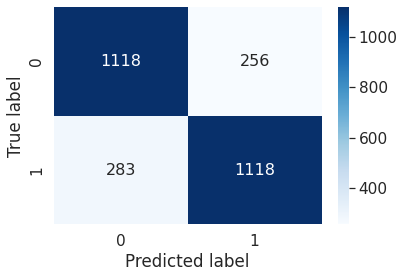

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Convert the predicted labels and actual labels to numpy arrays
y_pred = predictions4.select('prediction').rdd.map(lambda x: x[0]).collect()
y_true = predictions4.select('label').rdd.map(lambda x: x[0]).collect()

# Create the confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
sns.set(font_scale=1.4)
sns.heatmap(cm, annot=True, annot_kws={"size": 16}, cmap='Blues', fmt='g')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()


In [ ]:

# Define parameter grid
paramGrid_svm = ParamGridBuilder() \
    .addGrid(svm.regParam, [0.1, 0.01]) \
    .addGrid(svm.maxIter, [10, 100]) \
    .addGrid(svm.threshold, [0.0, 0.5]) \
    .build()


In [ ]:
from pyspark.ml.tuning import TrainValidationSplit

#Defining TrainValidationSplit

tvs_svm = TrainValidationSplit()\
.setSeed(100)\
.setTrainRatio(0.75)\
.setEstimatorParamMaps(paramGrid_svm)\
.setEstimator(svm)\
.setEvaluator(evaluator)

# train model using grid search
gridsearchModel92 = tvs_svm.fit(trainingDF)

2023/04/28 12:39:03 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'd653ada21db34ce5a9445c16f9f04d6e', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/04/28 12:40:47 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2023/04/28 12:41:59 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


In [ ]:

# Get the best model
bestModel_svm = gridsearchModel92.bestModel

# Print the parameters of the best model
print("Parameters for the Best Model:")
print("RegParam Parameter: %g" % bestModel_svm.getOrDefault('regParam'))
print("MaxIter Parameter: %g" % bestModel_svm.getOrDefault('maxIter'))
print("Tol Parameter: %g" % bestModel_svm.getOrDefault('tol'))

Parameters for the Best Model:
RegParam Parameter: 0.1
MaxIter Parameter: 10
Tol Parameter: 1e-06


In [ ]:
evaluator.evaluate(bestModel_svm.transform(testDF))

Out[57]: 0.8511711711711711

deployment